# Automating Crypto Website API Pull

In [7]:

from requests import Request, Session
from requests.exceptions import ConnectionError, Timeout, TooManyRedirects
import json

url = 'https://pro-api.coinmarketcap.com/v1/cryptocurrency/listings/latest'
parameters = {
  'start':'1',
  'limit':'500',
  'convert':'USD'
}
headers = {
  'Accepts': 'application/json',
  'X-CMC_PRO_API_KEY': '052b2290-6f0d-412c-a5bf-c9495916c7e0',
}

session = Session()
session.headers.update(headers)

try:
  response = session.get(url, params=parameters)
  data = json.loads(response.text)
  print(data)
except (ConnectionError, Timeout, TooManyRedirects) as e:
  print(e)

{'status': {'timestamp': '2023-05-01T12:47:25.339Z', 'error_code': 0, 'error_message': None, 'elapsed': 24, 'credit_count': 3, 'notice': None, 'total_count': 9423}, 'data': [{'id': 1, 'name': 'Bitcoin', 'symbol': 'BTC', 'slug': 'bitcoin', 'num_market_pairs': 10196, 'date_added': '2010-07-13T00:00:00.000Z', 'tags': ['mineable', 'pow', 'sha-256', 'store-of-value', 'state-channel', 'coinbase-ventures-portfolio', 'three-arrows-capital-portfolio', 'polychain-capital-portfolio', 'binance-labs-portfolio', 'blockchain-capital-portfolio', 'boostvc-portfolio', 'cms-holdings-portfolio', 'dcg-portfolio', 'dragonfly-capital-portfolio', 'electric-capital-portfolio', 'fabric-ventures-portfolio', 'framework-ventures-portfolio', 'galaxy-digital-portfolio', 'huobi-capital-portfolio', 'alameda-research-portfolio', 'a16z-portfolio', '1confirmation-portfolio', 'winklevoss-capital-portfolio', 'usv-portfolio', 'placeholder-ventures-portfolio', 'pantera-capital-portfolio', 'multicoin-capital-portfolio', 'para

In [8]:
type(data)

dict

In [9]:
#This allows you to see all the columns, not just like 15

import pandas as pd

pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [10]:
#This normalizes the data and makes it all pretty in a dataframe

df = pd.json_normalize(data['data'])
df['timestamp'] = pd.to_datetime('now')
df

C:\Users\USER\AppData\Local\Temp\ipykernel_2016\4244551283.py:4: FutureWarning: The parsing of 'now' in pd.to_datetime without `utc=True` is deprecated. In a future version, this will match Timestamp('now') and Timestamp.now()
  df['timestamp'] = pd.to_datetime('now')


,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,infinite_supply,platform,cmc_rank,self_reported_circulating_supply,self_reported_market_cap,tvl_ratio,last_updated,quote.USD.price,quote.USD.volume_24h,quote.USD.volume_change_24h,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d,quote.USD.market_cap,quote.USD.market_cap_dominance,quote.USD.fully_diluted_market_cap,quote.USD.tvl,quote.USD.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,timestamp
0,1,Bitcoin,BTC,bitcoin,10196,2010-07-13T00:00:00.000Z,"[mineable, pow, sha-256, store-of-value, state...",2.100000e+07,1.936121e+07,1.936121e+07,False,NaN,1,NaN,NaN,NaN,2023-05-01T12:45:00.000Z,2.859878e+04,1.857041e+10,75.8027,0.118996,-2.172843,4.057672,0.645465,22.427811,24.937634,5.537068e+11,46.8475,6.005743e+11,NaN,2023-05-01T12:45:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-05-01 12:56:07.485652
1,1027,Ethereum,ETH,ethereum,6809,2015-08-07T00:00:00.000Z,"[pos, smart-contracts, ethereum-ecosystem, coi...",NaN,1.203939e+08,1.203939e+08,False,NaN,2,NaN,NaN,NaN,2023-05-01T12:45:00.000Z,1.849758e+03,8.656862e+09,83.4127,0.127903,-2.680629,-0.082649,1.242624,12.959783,17.636847,2.226995e+11,18.8423,2.226995e+11,NaN,2023-05-01T12:45:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-05-01 12:56:07.485652
2,825,Tether,USDT,tether,52340,2015-02-25T00:00:00.000Z,"[payments, stablecoin, asset-backed-stablecoin...",NaN,8.171812e+10,8.509064e+10,False,NaN,3,NaN,NaN,NaN,2023-05-01T12:45:00.000Z,1.000280e+00,2.903968e+10,90.1118,-0.005087,-0.033120,0.016115,-0.016253,0.022028,0.025061,8.174097e+10,6.9160,8.511443e+10,NaN,2023-05-01T12:45:00.000Z,1027.0,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2023-05-01 12:56:07.485652
3,1839,BNB,BNB,bnb,1306,2017-07-25T00:00:00.000Z,"[marketplace, centralized-exchange, payments, ...",NaN,1.558626e+08,1.558626e+08,False,NaN,4,NaN,NaN,NaN,2023-05-01T12:45:00.000Z,3.359336e+02,1.152431e+09,150.5693,0.176048,4.368034,1.247492,6.845386,12.604619,8.328399,5.235949e+10,4.4301,5.235949e+10,NaN,2023-05-01T12:45:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-05-01 12:56:07.485652
4,3408,USD Coin,USDC,usd-coin,12111,2018-10-08T00:00:00.000Z,"[medium-of-exchange, stablecoin, asset-backed-...",NaN,3.048581e+10,3.048581e+10,False,NaN,5,NaN,NaN,NaN,2023-05-01T12:45:00.000Z,9.999920e-01,3.660637e+09,29.5633,-0.012145,-0.004605,-0.007590,0.001650,0.006308,0.007303,3.048557e+10,2.5796,3.048557e+10,NaN,2023-05-01T12:45:00.000Z,1027.0,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,2023-05-01 12:56:07.485652
5,52,XRP,XRP,xrp,940,2013-08-04T00:00:00.000Z,"[medium-of-exchange, enterprise-solutions, arr...",1.000000e+11,5.175081e+10,9.998900e+10,False,NaN,6,NaN,NaN,NaN,2023-05-01T12:45:00.000Z,4.666529e-01,8.208194e+08,80.7308,0.285120,-1.826723,0.429336,-9.575929,23.375417,16.438141,2.414966e+10,2.0430,4.666529e+10,NaN,2023-05-01T12:45:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-05-01 12:56:07.485652
6,2010,Cardano,ADA,cardano,776,2017-10-01T00:00:00.000Z,"[dpos, pos, platform, research, smart-contract...",4.500000e+10,3.481097e+10,3.574457e+10,False,NaN,7,NaN,NaN,NaN,2023-05-01T12:45:00.000Z,3.908486e-01,2.886216e+08,92.7842,0.344125,-2.224833,0.654809,-0.139080,11.348871,4.591119,1.360582e+10,1.1513,1.758819e+10,NaN,2023-05-01T12:45:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-05-01 12:56:07.485652
7,74,Dogecoin,DOGE,dogecoin,698,2013-12-15T00:00:00.000Z,"[mineable, pow, scrypt, medium-of-exchange, me...",NaN,1.391649e+11,1.391649e+11,False,NaN,8,NaN,NaN,NaN,2023-05-01T12:45:00.000Z,7.903494e-02,3.209800e+08,25.5359,0.101719,-2.310549,-0.139706,3.248136,-1.854437,-14.285406,1.099889e+10,0.9307,1.099889e+10,NaN,2023-05-01T12:45:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-05-01 12:56:07.485652
8,3890,Polygon,MATIC,polygon,680,2019-04-28T00:00:00.000Z,"[platform, enterprise-solutions, zero-knowledg...",1.000

In [11]:
def api_runner():


    url = 'https://pro-api.coinmarketcap.com/v1/cryptocurrency/listings/latest'
    parameters = {
        'start':'1',
        'limit':'500',
        'convert':'USD'
    }
    headers = { 
        'Accepts': 'application/json',
        'X-CMC_PRO_API_KEY': '052b2290-6f0d-412c-a5bf-c9495916c7e0',
    }

    session = Session()
    session.headers.update(headers)

    try:
      response = session.get(url, params=parameters)
      data = json.loads(response.text)
      #print(data)
    except (ConnectionError, Timeout, TooManyRedirects) as e:
     print(e)



    df = pd.json_normalize(data['data'])
    df['timestamp'] = pd.to_datetime('now')
    df
    
    if not os.path.isfile(r'C:\Users\USER\Documents\Python Scripts\API.csv'):
        df.to_csv(r'C:\Users\USER\Documents\Python Scripts\API.csv', header='column_names')
    else:
        df.to_csv(r'C:\Users\USER\Documents\Python Scripts\API.csv', mode='a', header=False)

In [12]:
import os
from time import time
from time import sleep

for i in range(333):
    api_runner()
    print('API Runner completed')
    sleep(60) #sleep for 1 minute
exit()    

C:\Users\USER\AppData\Local\Temp\ipykernel_2016\484758994.py:28: FutureWarning: The parsing of 'now' in pd.to_datetime without `utc=True` is deprecated. In a future version, this will match Timestamp('now') and Timestamp.now()
  df['timestamp'] = pd.to_datetime('now')


API Runner completed


C:\Users\USER\AppData\Local\Temp\ipykernel_2016\484758994.py:28: FutureWarning: The parsing of 'now' in pd.to_datetime without `utc=True` is deprecated. In a future version, this will match Timestamp('now') and Timestamp.now()
  df['timestamp'] = pd.to_datetime('now')


API Runner completed


KeyboardInterrupt: 

In [15]:
df72 = pd.read_csv(r'C:\Users\USER\Documents\Python Scripts\API.csv')
df72

,0,1,Bitcoin,BTC,bitcoin,10196,2010-07-13T00:00:00.000Z,"['mineable', 'pow', 'sha-256', 'store-of-value', 'state-channel', 'coinbase-ventures-portfolio', 'three-arrows-capital-portfolio', 'polychain-capital-portfolio', 'binance-labs-portfolio', 'blockchain-capital-portfolio', 'boostvc-portfolio', 'cms-holdings-portfolio', 'dcg-portfolio', 'dragonfly-capital-portfolio', 'electric-capital-portfolio', 'fabric-ventures-portfolio', 'framework-ventures-portfolio', 'galaxy-digital-portfolio', 'huobi-capital-portfolio', 'alameda-research-portfolio', 'a16z-portfolio', '1confirmation-portfolio', 'winklevoss-capital-portfolio', 'usv-portfolio', 'placeholder-ventures-portfolio', 'pantera-capital-portfolio', 'multicoin-capital-portfolio', 'paradigm-portfolio', 'btc-ecosystem']",21000000.0,19361206.0,19361206.0.1,False,Unnamed: 12,1.1,Unnamed: 14,Unnamed: 15,Unnamed: 16,2023-05-01T12:58:00.000Z,28604.805279273085,18592798105.19378,75.8352,0.24102992,-2.2459993,4.27343817,0.62294932,22.47963249,24.76811557,553823527601.8937,46.8572,600700910864.73,Unnamed: 30,2023-05-01T12:58:00.000Z.1,Unnamed: 32,Unnamed: 33,Unnamed: 34,Unnamed: 35,Unnamed: 36,2023-05-01 13:01:19.705975
0,1,1027,Ethereum,ETH,ethereum,6809,2015-08-07T00:00:00.000Z,"['pos', 'smart-contracts', 'ethereum-ecosystem...",NaN,120393879.50612,120393879.50612,False,NaN,2,NaN,NaN,NaN,2023-05-01T12:58:00.000Z,1849.58820,8686308429.20645,83.77330,0.19584,-2.77707,0.13216,1.19513,13.10479,17.42873,222679098630.15811,18.84090,222679098630.16000,NaN,2023-05-01T12:58:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-05-01 13:01:19.705975
1,2,825,Tether,USDT,tether,52340,2015-02-25T00:00:00.000Z,"['payments', 'stablecoin', 'asset-backed-stabl...",NaN,81718117573.08585,85090638896.27005,False,NaN,3,NaN,NaN,NaN,2023-05-01T12:58:00.000Z,1.00022,29090795886.77872,90.72900,0.01218,-0.03853,0.01856,-0.02372,0.01741,0.01672,81735972588.98813,6.91570,85109230791.87000,NaN,2023-05-01T12:58:00.000Z,1027.00000,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2023-05-01 13:01:19.705975
2,3,1839,BNB,BNB,bnb,1306,2017-07-25T00:00:00.000Z,"['marketplace', 'centralized-exchange', 'payme...",NaN,155862602.75747,155862602.75747,False,NaN,4,NaN,NaN,NaN,2023-05-01T12:58:00.000Z,335.53681,1156682000.99705,151.66840,0.14459,4.23490,1.04899,6.65554,12.48055,7.98029,52297640279.73294,4.42490,52297640279.73000,NaN,2023-05-01T12:58:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-05-01 13:01:19.705975
3,4,3408,USD Coin,USDC,usd-coin,12111,2018-10-08T00:00:00.000Z,"['medium-of-exchange', 'stablecoin', 'asset-ba...",NaN,30485812722.05862,30485812722.05862,False,NaN,5,NaN,NaN,NaN,2023-05-01T12:58:00.000Z,0.99991,3666457369.74462,29.73910,0.00448,-0.00568,-0.00878,-0.01215,-0.00509,-0.00840,30483143377.39576,2.58030,30483143377.40000,NaN,2023-05-01T12:58:00.000Z,1027.00000,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,2023-05-01 13:01:19.705975
4,5,52,XRP,XRP,xrp,940,2013-08-04T00:00:00.000Z,"['medium-of-exchange', 'enterprise-solutions',...",100000000000.00000,51750810378.00000,99988998998.00000,False,NaN,6,NaN,NaN,NaN,2023-05-01T12:58:00.000Z,0.46650,822802013.80669,81.33210,0.28775,-1.90174,0.39811,-9.30257,23.42741,16.07300,24141751956.81217,2.04260,46649997904.33000,NaN,2023-05-01T12:58:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-05-01 13:01:19.705975
5,6,2010,Cardano,ADA,cardano,776,2017-10-01T00:00:00.000Z,"['dpos', 'pos', 'platform', 'research', 'smart...",45000000000.00000,34810973439.81100,35744572183.81100,False,NaN,7,NaN,NaN,NaN,2023-05-01T12:58:00.000Z,0.39080,289527060.56472,93.46680,0.35454,-2.30241,0.66572,-0.03810,11.33250,4.23045,13604242054.31939,1.15150,17586146894.25000,NaN,2023-05-01T12:58:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-05-01 13:01:19.705975
6,7,74,Dogecoin,DOGE,dogecoin,698,2013-12-15T00:00:00.000Z,"['mineable', 'pow', 'scrypt', 'medium-of-excha...",NaN,139164886383.70523,139164886383.70523,False,NaN,8,NaN,NaN,NaN,2023-05-01T12:58:00.000Z,0.07901,320696105.10539,25.75530,0.11904,-2.36871,-0.08895,2.87423,

In [18]:
# One thing I noticed was the scientific notation. I want to be able to see the numbers in this case

pd.set_option('display.float_format', lambda x: '%.5f' % x)

In [19]:
df

,id,name,symbol,slug,num_market_pairs,date_added,tags,max_supply,circulating_supply,total_supply,infinite_supply,platform,cmc_rank,self_reported_circulating_supply,self_reported_market_cap,tvl_ratio,last_updated,quote.USD.price,quote.USD.volume_24h,quote.USD.volume_change_24h,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d,quote.USD.market_cap,quote.USD.market_cap_dominance,quote.USD.fully_diluted_market_cap,quote.USD.tvl,quote.USD.last_updated,platform.id,platform.name,platform.symbol,platform.slug,platform.token_address,timestamp
0,1,Bitcoin,BTC,bitcoin,10196,2010-07-13T00:00:00.000Z,"[mineable, pow, sha-256, store-of-value, state...",21000000.00000,19361206.00000,19361206.00000,False,NaN,1,NaN,NaN,NaN,2023-05-01T12:45:00.000Z,28598.77681,18570410837.90964,75.80270,0.11900,-2.17284,4.05767,0.64547,22.42781,24.93763,553706809073.32825,46.84750,600574312909.01001,NaN,2023-05-01T12:45:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-05-01 12:56:07.485652
1,1027,Ethereum,ETH,ethereum,6809,2015-08-07T00:00:00.000Z,"[pos, smart-contracts, ethereum-ecosystem, coi...",NaN,120393879.50612,120393879.50612,False,NaN,2,NaN,NaN,NaN,2023-05-01T12:45:00.000Z,1849.75803,8656862022.97012,83.41270,0.12790,-2.68063,-0.08265,1.24262,12.95978,17.63685,222699545928.35944,18.84230,222699545928.35999,NaN,2023-05-01T12:45:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-05-01 12:56:07.485652
2,825,Tether,USDT,tether,52340,2015-02-25T00:00:00.000Z,"[payments, stablecoin, asset-backed-stablecoin...",NaN,81718117573.08585,85090638896.27005,False,NaN,3,NaN,NaN,NaN,2023-05-01T12:45:00.000Z,1.00028,29039678682.49343,90.11180,-0.00509,-0.03312,0.01612,-0.01625,0.02203,0.02506,81740965496.46471,6.91600,85114429757.53000,NaN,2023-05-01T12:45:00.000Z,1027.00000,Ethereum,ETH,ethereum,0xdac17f958d2ee523a2206206994597c13d831ec7,2023-05-01 12:56:07.485652
3,1839,BNB,BNB,bnb,1306,2017-07-25T00:00:00.000Z,"[marketplace, centralized-exchange, payments, ...",NaN,155862602.75747,155862602.75747,False,NaN,4,NaN,NaN,NaN,2023-05-01T12:45:00.000Z,335.93364,1152431256.14723,150.56930,0.17605,4.36803,1.24749,6.84539,12.60462,8.32840,52359491893.94560,4.43010,52359491893.95000,NaN,2023-05-01T12:45:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-05-01 12:56:07.485652
4,3408,USD Coin,USDC,usd-coin,12111,2018-10-08T00:00:00.000Z,"[medium-of-exchange, stablecoin, asset-backed-...",NaN,30485812722.05862,30485812722.05862,False,NaN,5,NaN,NaN,NaN,2023-05-01T12:45:00.000Z,0.99999,3660637066.53535,29.56330,-0.01215,-0.00460,-0.00759,0.00165,0.00631,0.00730,30485569561.19537,2.57960,30485569561.20000,NaN,2023-05-01T12:45:00.000Z,1027.00000,Ethereum,ETH,ethereum,0xa0b86991c6218b36c1d19d4a2e9eb0ce3606eb48,2023-05-01 12:56:07.485652
5,52,XRP,XRP,xrp,940,2013-08-04T00:00:00.000Z,"[medium-of-exchange, enterprise-solutions, arr...",100000000000.00000,51750810378.00000,99988998998.00000,False,NaN,6,NaN,NaN,NaN,2023-05-01T12:45:00.000Z,0.46665,820819379.90457,80.73080,0.28512,-1.82672,0.42934,-9.57593,23.37542,16.43814,24149664757.99340,2.04300,46665288101.96000,NaN,2023-05-01T12:45:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-05-01 12:56:07.485652
6,2010,Cardano,ADA,cardano,776,2017-10-01T00:00:00.000Z,"[dpos, pos, platform, research, smart-contract...",45000000000.00000,34810973439.81100,35744572183.81100,False,NaN,7,NaN,NaN,NaN,2023-05-01T12:45:00.000Z,0.39085,288621605.57134,92.78420,0.34413,-2.22483,0.65481,-0.13908,11.34887,4.59112,13605819322.51851,1.15130,17588185822.27000,NaN,2023-05-01T12:45:00.000Z,NaN,NaN,NaN,NaN,NaN,2023-05-01 12:56:07.485652
7,74,Dogecoin,DOGE,dogecoin,698,2013-12-15T00:00:00.000Z,"[mineable, pow, scrypt, medium-of-exchange, me...",NaN,139164886383.70523,139164886383.70523,False,NaN,8,NaN,NaN,NaN,2023-05-01T12:45:00.000Z,0.07903,320979991.32427,25.53590,0.10172,-2.31055,-0.13971,3.24814,-1.85444,-14.28541,10998888501.24716,0.93070,10998888501.25000,NaN,2023-05-01T12:45:00.000Z,NaN,NaN,NaN,NaN,NaN,2

In [20]:
# Taking look at the coin trends over time

df3 = df.groupby('name', sort=False)[['quote.USD.percent_change_1h','quote.USD.percent_change_24h','quote.USD.percent_change_7d','quote.USD.percent_change_30d','quote.USD.percent_change_60d','quote.USD.percent_change_90d']].mean()
df3

,quote.USD.percent_change_1h,quote.USD.percent_change_24h,quote.USD.percent_change_7d,quote.USD.percent_change_30d,quote.USD.percent_change_60d,quote.USD.percent_change_90d
name,,,,,,
Bitcoin,0.11900,-2.17284,4.05767,0.64547,22.42781,24.93763
Ethereum,0.12790,-2.68063,-0.08265,1.24262,12.95978,17.63685
Tether,-0.00509,-0.03312,0.01612,-0.01625,0.02203,0.02506
BNB,0.17605,4.36803,1.24749,6.84539,12.60462,8.32840
USD Coin,-0.01215,-0.00460,-0.00759,0.00165,0.00631,0.00730
XRP,0.28512,-1.82672,0.42934,-9.57593,23.37542,16.43814
Cardano,0.34413,-2.22483,0.65481,-0.13908,11.34887,4.59112
Dogecoin,0.10172,-2.31055,-0.13971,3.24814,-1.85444,-14.28541
Polygon,0.09880,-1.64869,-1.59621,-11.62910,-18.80367,-10.06041


In [21]:
df4 = df3.stack()
df4

name                                                        
Bitcoin                         quote.USD.percent_change_1h         0.11900
                                quote.USD.percent_change_24h       -2.17284
                                quote.USD.percent_change_7d         4.05767
                                quote.USD.percent_change_30d        0.64547
                                quote.USD.percent_change_60d       22.42781
                                quote.USD.percent_change_90d       24.93763
Ethereum                        quote.USD.percent_change_1h         0.12790
                                quote.USD.percent_change_24h       -2.68063
                                quote.USD.percent_change_7d        -0.08265
                                quote.USD.percent_change_30d        1.24262
                                quote.USD.percent_change_60d       12.95978
                                quote.USD.percent_change_90d       17.63685
Tether                     

In [22]:
type(df4)

pandas.core.series.Series

In [23]:
df5 = df4.to_frame(name='values')
df5

values
name                                                                    
Bitcoin                        quote.USD.percent_change_1h       0.11900
                               quote.USD.percent_change_24h     -2.17284
                               quote.USD.percent_change_7d       4.05767
                               quote.USD.percent_change_30d      0.64547
                               quote.USD.percent_change_60d     22.42781
                               quote.USD.percent_change_90d     24.93763
Ethereum                       quote.USD.percent_change_1h       0.12790
                               quote.USD.percent_change_24h     -2.68063
                               quote.USD.percent_change_7d      -0.08265
                               quote.USD.percent_change_30d      1.24262
                               quote.USD.percent_change_60d     12.95978
                               quote.USD.percent_change_90d     17.63685
Tether                         quote.USD.percent_change_1h      -0.00509
                               quote.USD.percent_change_24h     -0.03312
                               quote.USD.percent_change_7d       0.01612
                               quote.USD.percent_change_30d     -0.01625
                               quote.USD.percent_change_60d      0.02203
                               quote.USD.percent_change_90d      0.02506
BNB                            quote.USD.percent_change_1h       0.17605
                               quote.USD.percent_change_24h      4.36803
                               quote.USD.percent_change_7d       1.24749
                               quote.USD.percent_change_30d      6.84539
                               quote.USD.percent_change_60d     12.60462
                               quote.USD.percent_change_90d      8.32840
USD Coin                       quote.USD.percent_change_1h      -0.01215
                               quote.USD.percent_change_24h     -0.00460
                               quote.USD.percent_change_7d      -0.00759
                               quote.USD.percent_change_30d      0.00165
                               quote.USD.percent_change_60d      0.00631
                               quote.USD.percent_change_90d      0.00730
XRP                            quote.USD.percent_change_1h       0.28512
                               quote.USD.percent_change_24h     -1.82672
                               quote.USD.percent_change_7d       0.42934
                               quote.USD.percent_change_30d     -9.57593
                               quote.USD.percent_change_60d     23.37542
                               quote.USD.percent_change_90d     16.43814
Cardano                        quote.USD.percent_change_1h       0.34413
                               quote.USD.percent_change_24h     -2.22483
                               quote.USD.percent_change_7d       0.65481
                               quote.USD.percent_change_30d     -0.13908
                               quote.USD.percent_change_60d     11.34887
                               quote.USD.percent_change_90d      4.59112
Dogecoin                       quote.USD.percent_change_1h       0.10172
                               quote.USD.percent_change_24h     -2.31055
                               quote.USD.percent_change_7d      -0.13971
                               quote.USD.percent_change_30d      3.24814
                               quote.USD.percent_change_60d     -1.85444
                               quote.USD.percent_change_90d    -14.28541
Polygon                        quote.USD.percent_change_1h       0.09880
                               quote.USD.percent_change_24h     -1.64869
                               quote.USD.percent_change_7d      -1.59621
                               quote.USD.percent_change_30d    -11.62910
                               quote.USD.percent_change_60d    -18.80367
                               quote.USD.percent_ch

In [24]:
type(df5)

pandas.core.frame.DataFrame

In [25]:
df5.count()

values    3000
dtype: int64

In [28]:
#Because of how it's structured above we need to set an index. I don't want to pass a column as an index for this dataframe
#So I'm going to create a range and pass that as the dataframe. You can make this more dynamic, but I'm just going to hard code it


index = pd.Index(range(3000))

df6 = df5.reset_index()
df6



,name,level_1,values
0,Bitcoin,quote.USD.percent_change_1h,0.11900
1,Bitcoin,quote.USD.percent_change_24h,-2.17284
2,Bitcoin,quote.USD.percent_change_7d,4.05767
3,Bitcoin,quote.USD.percent_change_30d,0.64547
4,Bitcoin,quote.USD.percent_change_60d,22.42781
5,Bitcoin,quote.USD.percent_change_90d,24.93763
6,Ethereum,quote.USD.percent_change_1h,0.12790
7,Ethereum,quote.USD.percent_change_24h,-2.68063
8,Ethereum,quote.USD.percent_change_7d,-0.08265
9,Ethereum,quote.USD.percent_change_30d,1.24262


In [29]:
# Changing the column name

df7 = df6.rename(columns={'level_1': 'percent_change'})
df7

,name,percent_change,values
0,Bitcoin,quote.USD.percent_change_1h,0.11900
1,Bitcoin,quote.USD.percent_change_24h,-2.17284
2,Bitcoin,quote.USD.percent_change_7d,4.05767
3,Bitcoin,quote.USD.percent_change_30d,0.64547
4,Bitcoin,quote.USD.percent_change_60d,22.42781
5,Bitcoin,quote.USD.percent_change_90d,24.93763
6,Ethereum,quote.USD.percent_change_1h,0.12790
7,Ethereum,quote.USD.percent_change_24h,-2.68063
8,Ethereum,quote.USD.percent_change_7d,-0.08265
9,Ethereum,quote.USD.percent_change_30d,1.24262


In [32]:
df7['percent_change'] = df7['percent_change'].replace(['quote.USD.percent_change_24h','quote.USD.percent_change_7d','quote.USD.percent_change_30d','quote.USD.percent_change_60d','quote.USD.percent_change_90d'],['24h','7d','30d','60d','90d'])
df7

,name,percent_change,values
0,Bitcoin,quote.USD.percent_change_1h,0.11900
1,Bitcoin,24h,-2.17284
2,Bitcoin,7d,4.05767
3,Bitcoin,30d,0.64547
4,Bitcoin,60d,22.42781
5,Bitcoin,90d,24.93763
6,Ethereum,quote.USD.percent_change_1h,0.12790
7,Ethereum,24h,-2.68063
8,Ethereum,7d,-0.08265
9,Ethereum,30d,1.24262


In [30]:
import seaborn as sns
import matplotlib.pyplot as plt

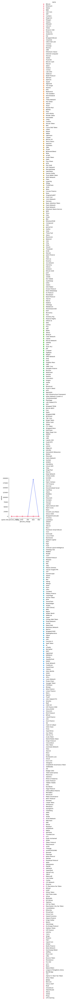

In [33]:
sns.catplot(x='percent_change', y='values', hue='name', data=df7, kind='point')

In [40]:
# Now to do something much simpler
# creating a dataframe with the columns we want

df10 = df[['name','quote.USD.price','timestamp']]
df10 = df10.query("name == 'Ethereum'")
df10

,name,quote.USD.price,timestamp
1,Ethereum,1849.75803,2023-05-01 12:56:07.485652


<Axes: xlabel='timestamp', ylabel='quote.USD.price'>

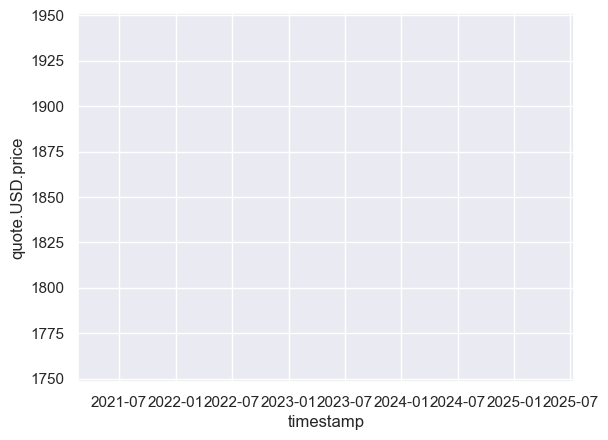

In [41]:
sns.set_theme(style="darkgrid")

sns.lineplot(x='timestamp', y='quote.USD.price', data = df10)

In [42]:
df11 = df[['name','quote.USD.price','timestamp']]
df11 = df11.query("name == 'Tether'")
df11

,name,quote.USD.price,timestamp
2,Tether,1.00028,2023-05-01 12:56:07.485652


<Axes: xlabel='timestamp', ylabel='quote.USD.price'>

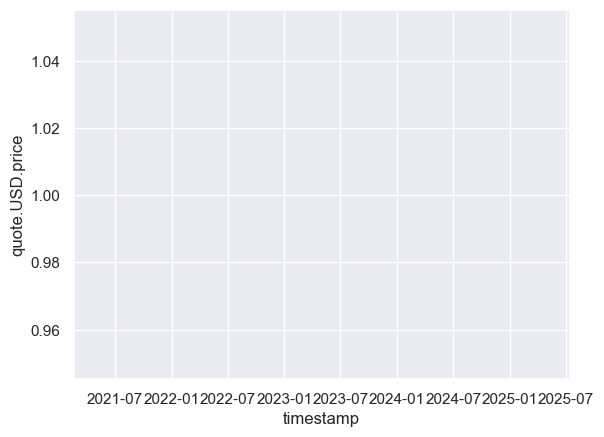

In [43]:
sns.set_theme(style="darkgrid")

sns.lineplot(x='timestamp', y='quote.USD.price', data = df11)

In [44]:
df12 = df[['name','quote.USD.price','timestamp']]
df12 = df12.query("name == 'BNB'")
df12

,name,quote.USD.price,timestamp
3,BNB,335.93364,2023-05-01 12:56:07.485652


<Axes: xlabel='timestamp', ylabel='quote.USD.price'>

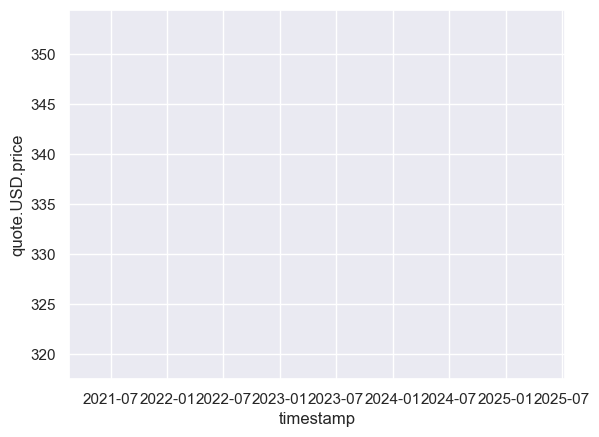

In [45]:
sns.set_theme(style="darkgrid")

sns.lineplot(x='timestamp', y='quote.USD.price', data = df12)